In [1]:
import pandas as pd
import numpy as np

In [2]:
crop_dataset = pd.read_csv("Crop_recommendation.csv")
soil_dataset = pd.read_csv("Soil.csv")

In [3]:
crop_dataset.head()

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice


In [4]:
soil_dataset.head()

,pH,EC,OC,OM,N,P,K,Zn,Fe,Cu,Mn,Sand,Silt,Clay,CaCO3,CEC,Output
0,7.74,0.40,0.01,0.01,75,20.0,279,0.48,6.4,0.21,4.7,84.3,6.8,8.9,6.72,7.81,Fertile
1,9.02,0.31,0.02,0.03,85,15.7,247,0.27,6.4,0.16,5.6,90.4,3.9,5.7,4.61,7.19,Fertile
2,7.80,0.17,0.02,0.03,77,35.6,265,0.46,6.2,0.51,6.1,84.5,6.9,8.6,1.53,12.32,Fertile
3,8.36,0.02,0.03,0.05,106,6.4,127,0.50,3.1,0.28,2.3,93.9,1.7,4.4,0.00,1.60,Non Fertile
4,8.36,1.08,0.03,0.05,96,10.5,96,0.31,3.2,0.23,4.1,91.5,4.1,4.4,9.08,7.21,Non Fertile


In [5]:
# x1 = crop_dataset[['N','P','K','temperature','humidity','ph','rainfall']].values
# y1 = crop_dataset[['label']].values
# x2 = soil_dataset[['pH','EC','OC','OM','N','P','K','Zn','Fe','Cu','Mn','Sand','Silt','Clay','CaCO3','CEC']].values
# y2 = soil_dataset[['Output']].values

In [6]:
x1 = crop_dataset.drop('label',axis=1)
y1 = crop_dataset['label']

In [7]:

x2 = soil_dataset.drop('Output', axis=1)
y2 = soil_dataset['Output']

In [8]:
x1

,N,P,K,temperature,humidity,ph,rainfall
0,90,42,43,20.879744,82.002744,6.502985,202.935536
1,85,58,41,21.770462,80.319644,7.038096,226.655537
2,60,55,44,23.004459,82.320763,7.840207,263.964248
3,74,35,40,26.491096,80.158363,6.980401,242.864034
4,78,42,42,20.130175,81.604873,7.628473,262.717340
...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507
2196,99,15,27,27.417112,56.636362,6.086922,127.924610
2197,118,33,30,24.131797,67.225123,6.362608,173.322839
2198,117,32,34,26.272418,52.127394,6.758793,127.175293


In [9]:
y1

0         rice
1         rice
2         rice
3         rice
4         rice
         ...  
2195    coffee
2196    coffee
2197    coffee
2198    coffee
2199    coffee
Name: label, Length: 2200, dtype: object

In [10]:
x2

,pH,EC,OC,OM,N,P,K,Zn,Fe,Cu,Mn,Sand,Silt,Clay,CaCO3,CEC
0,7.74,0.40,0.01,0.01,75,20.0,279,0.48,6.4,0.21,4.7,84.3,6.8,8.9,6.72,7.81
1,9.02,0.31,0.02,0.03,85,15.7,247,0.27,6.4,0.16,5.6,90.4,3.9,5.7,4.61,7.19
2,7.80,0.17,0.02,0.03,77,35.6,265,0.46,6.2,0.51,6.1,84.5,6.9,8.6,1.53,12.32
3,8.36,0.02,0.03,0.05,106,6.4,127,0.50,3.1,0.28,2.3,93.9,1.7,4.4,0.00,1.60
4,8.36,1.08,0.03,0.05,96,10.5,96,0.31,3.2,0.23,4.1,91.5,4.1,4.4,9.08,7.21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9.21,0.14,0.62,1.06,278,9.8,165,0.18,8.6,0.57,5.8,88.2,2.4,9.4,4.23,8.81
96,7.50,0.22,0.68,1.17,272,9.5,139,0.72,2.6,0.12,1.8,95.4,1.4,3.2,0.00,5.58
97,8.26,0.25,0.71,1.22,277,11.5,264,0.36,7.6,0.07,0.8,90.7,2.5,6.8,3.85,7.26
98,8.12,0.14,0.73,1.25,265,4.6,283,0.38,3.7,0.18,0.8,86.0,6.7,7.3,0.00,3.10


In [11]:
y2

0         Fertile
1         Fertile
2         Fertile
3     Non Fertile
4     Non Fertile
         ...     
95        Fertile
96    Non Fertile
97        Fertile
98    Non Fertile
99        Fertile
Name: Output, Length: 100, dtype: object

## Splitting the Dataset

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,test_size=0.3,random_state=0)

In [14]:
x2_train,x2_test,y2_train,y2_test=train_test_split(x2,y2,test_size=0.3,random_state=0)

## Random Forest model

In [15]:
from sklearn.ensemble import RandomForestClassifier

In [16]:
clf=RandomForestClassifier(n_estimators=100,criterion='gini',random_state=0)

In [17]:
clf

RandomForestClassifier(random_state=0)

In [18]:
clf.fit(x1_train,y1_train)

RandomForestClassifier(random_state=0)

In [19]:
predict_y1 = clf.predict(x1_test)

In [20]:
predict_y1

array(['watermelon', 'watermelon', 'grapes', 'chickpea', 'blackgram',
       'rice', 'mothbeans', 'kidneybeans', 'muskmelon', 'banana',
       'mothbeans', 'coffee', 'lentil', 'mungbean', 'mango', 'apple',
       'coffee', 'lentil', 'coffee', 'mango', 'coconut', 'blackgram',
       'kidneybeans', 'jute', 'cotton', 'coffee', 'lentil', 'orange',
       'mothbeans', 'kidneybeans', 'pomegranate', 'rice', 'maize',
       'muskmelon', 'coconut', 'cotton', 'mango', 'mango', 'watermelon',
       'blackgram', 'maize', 'blackgram', 'pigeonpeas', 'watermelon',
       'pigeonpeas', 'mungbean', 'kidneybeans', 'kidneybeans', 'cotton',
       'mungbean', 'mothbeans', 'blackgram', 'apple', 'muskmelon',
       'pigeonpeas', 'banana', 'papaya', 'mango', 'lentil', 'cotton',
       'orange', 'mungbean', 'watermelon', 'rice', 'muskmelon', 'apple',
       'grapes', 'coffee', 'apple', 'orange', 'coconut', 'pomegranate',
       'kidneybeans', 'maize', 'grapes', 'mothbeans', 'chickpea', 'maize',
       'jute',

In [21]:
clf.score(x1_test,y1_test)

0.9939393939393939

In [22]:
clf.predict([[60,55,44,23.004459,82.320763,7.840207,263.964248]])

C:\Users\KRISHNA MOHAN\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array(['rice'], dtype=object)

In [23]:
from sklearn.metrics import accuracy_score,confusion_matrix
accuracy = accuracy_score(y1_test,predict_y1)
print("Accuracy: ", accuracy)

Accuracy:  0.9939393939393939


In [24]:
#Crop dataset
accuracy = accuracy_score(y1_test,predict_y1)
print("Accuracy: ", accuracy) # accuracy
confusion_matrix(y1_test,predict_y1) # confusion matrix

Accuracy:  0.9939393939393939


array([[28,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0, 30,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0, 30,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 34,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 26,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 29,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 28,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 30,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 30,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  1,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 26,  0,  0,

In [25]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y1_test,predict_y1)

array([[28,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0, 30,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0, 30,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 34,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 26,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 29,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 28,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 30,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 30,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  1,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 26,  0,  0,

## draw heat map

In [26]:
clf2 = RandomForestClassifier(n_estimators=100,criterion='gini',random_state=0)

In [27]:
clf2.fit(x2_train,y2_train)

RandomForestClassifier(random_state=0)

In [28]:
predict_y2 = clf2.predict(x2_test)

In [29]:
predict_y2

array(['Non Fertile', 'Fertile', 'Fertile', 'Non Fertile', 'Non Fertile',
       'Fertile', 'Non Fertile', 'Non Fertile', 'Fertile', 'Fertile',
       'Non Fertile', 'Non Fertile', 'Non Fertile', 'Fertile',
       'Non Fertile', 'Fertile', 'Fertile', 'Non Fertile', 'Fertile',
       'Fertile', 'Non Fertile', 'Fertile', 'Non Fertile', 'Fertile',
       'Non Fertile', 'Fertile', 'Non Fertile', 'Fertile', 'Fertile',
       'Fertile'], dtype=object)

In [30]:
clf2.score(x2_test,y2_test)

0.9333333333333333

In [31]:
accuracy_soil = accuracy_score(y2_test,predict_y2)
print("Accuracy: ",accuracy_soil)

Accuracy:  0.9333333333333333


In [32]:
clf2.predict([[8,0,0,0,106,6,127,0,3,0,2,93,1,4,0,1]])

C:\Users\KRISHNA MOHAN\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array(['Non Fertile'], dtype=object)

In [33]:
estimator = clf.estimators_[0]

In [34]:
confusion_matrix(y2_test,predict_y2)

array([[16,  2],
       [ 0, 12]], dtype=int64)

In [35]:
from sklearn.tree import export_graphviz
from sklearn import tree
export_graphviz(estimator,out_file='RF_Crop.dot',filled=True,rounded=True,precision=2)

In [36]:
from IPython.display import Image
Image(filename = 'RF_Crop.png')

In [37]:
import matplotlib.pyplot as plt
fig,axes = plt.subplots(nrows = 2,ncols = 1,figsize = (20,10), dpi=900)
for index in range(0, 2):
    tree.plot_tree(clf.estimators_[index],
                   filled = True,
                   ax = axes[index])
    axes[index].set_title('Estimator: ' + str((index)+1),fontsize= 11)
fig.savefig('RF_CROP3trees.png')

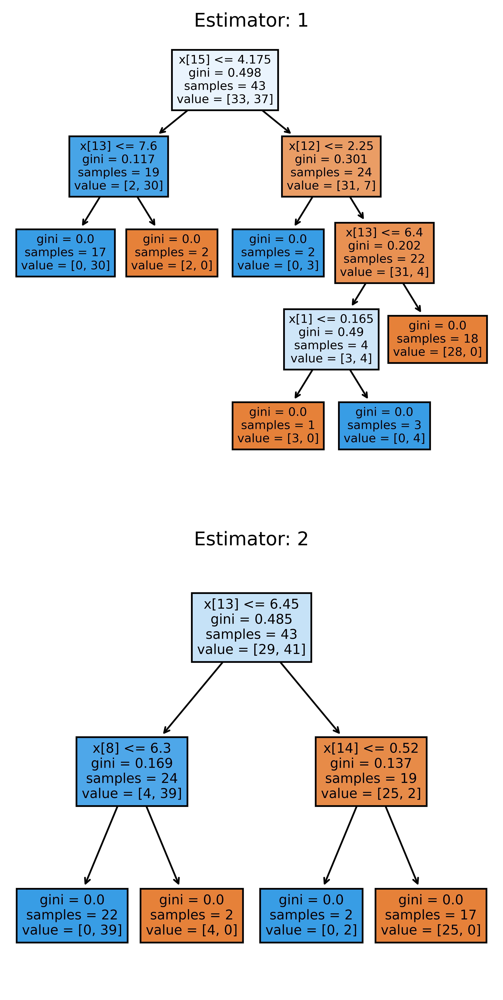

In [38]:
fig,axes = plt.subplots(nrows = 2,ncols = 1,figsize = (5,10), dpi=900)
for index in range(0, 2):
    tree.plot_tree(clf2.estimators_[index],
                   filled = True,
                   ax = axes[index])
    axes[index].set_title('Estimator: ' + str((index)+1),fontsize= 11)
fig.savefig('RF_SOIL3trees.png')

In [39]:
def recommendation(N,P,K,temperature,humidity,ph,rainfall):
    features = np.array([[N,P,K,temperature,humidity,ph,rainfall]])
    prediction = clf.predict(features)
    return prediction

In [40]:
N = 40
P = 50
K = 50
temperature = 40.0
humidity = 20
ph = 100
rainfall = 100
c = ""
crop = recommendation(N,P,K,temperature,humidity,ph,rainfall)
if crop in crop_dataset.label.unique():
    c +=crop
    print(c," is best crop to be cultivated ")
else:
    print("Sorry we are unable to recommend a crop for this environment")

['kidneybeans']  is best crop to be cultivated 


C:\Users\KRISHNA MOHAN\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [41]:
clf.predict([[40,50,50,40.0,20,100,100]])

C:\Users\KRISHNA MOHAN\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array(['kidneybeans'], dtype=object)

In [42]:
import pickle
pickle.dump(clf,open('crop_model.pkl','wb'))

In [43]:
import pickle
pickle.dump(clf2,open('soil_model.pkl','wb'))

In [44]:
from sklearn.metrics import classification_report
print(classification_report(y2_test,predict_y2))

              precision    recall  f1-score   support

     Fertile       1.00      0.89      0.94        18
 Non Fertile       0.86      1.00      0.92        12

    accuracy                           0.93        30
   macro avg       0.93      0.94      0.93        30
weighted avg       0.94      0.93      0.93        30



In [45]:
from sklearn.metrics import classification_report
print(classification_report(y1_test,predict_y1))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        28
      banana       1.00      1.00      1.00        30
   blackgram       0.97      0.97      0.97        31
    chickpea       1.00      1.00      1.00        34
     coconut       1.00      1.00      1.00        26
      coffee       1.00      1.00      1.00        29
      cotton       1.00      1.00      1.00        28
      grapes       1.00      1.00      1.00        30
        jute       0.97      0.97      0.97        31
 kidneybeans       1.00      1.00      1.00        26
      lentil       1.00      1.00      1.00        22
       maize       0.96      1.00      0.98        27
       mango       1.00      1.00      1.00        28
   mothbeans       1.00      0.97      0.99        36
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        30
      orange       1.00      1.00      1.00        34
      papaya       1.00    

In [46]:
report1 = classification_report(y1_test, predict_y1, output_dict=True)
accuracy = report1['accuracy']
macro_precision =  report1['macro avg']['precision'] 
macro_recall = report1['macro avg']['recall']    
macro_f1 = report1['macro avg']['f1-score']
print("Accuracy: ",accuracy,"\n","Precision: ",macro_precision,"\n","Recall_score: ",macro_recall,"\n","F1_score: ",macro_f1)

Accuracy:  0.9939393939393939 
 Precision:  0.994215570828474 
 Recall_score:  0.9945763211892245 
 F1_score:  0.994372296305302


In [47]:
report2= classification_report(y2_test, predict_y2, output_dict=True)
accuracy = report2['accuracy']
macro_precision =  report2['macro avg']['precision'] 
macro_recall = report2['macro avg']['recall']    
macro_f1 = report2['macro avg']['f1-score']
print("Accuracy: ",accuracy,"\n","Precision: ",macro_precision,"\n","Recall_score: ",macro_recall,"\n","F1_score: ",macro_f1)

Accuracy:  0.9333333333333333 
 Precision:  0.9285714285714286 
 Recall_score:  0.9444444444444444 
 F1_score:  0.9321266968325792
